# Project: Investigate a Dataset (TMDb movie data)

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
<li><a href="#limitation">Limitation in our analysis</a></li>   
<li><a href="#references">References</a></li>

</ul>

<a id='intro'></a>
## Introduction

> We are going to use TMDb data; this data set contains informationabout 10,000 movies collected fromThe Movie Database (TMDb), including user ratings and revenue. 
> - Certain columns, like ‘cast’and ‘genres’, contain multiplevalues separated by pipe (|) characters. 
- There are some odd charactersin the ‘cast’ column. We are going to clean them.
- The final two columns ending with “_adj” show the budget and revenue of the associated movie in terms of 2015 dollars,accounting for inflation overtime.
>
> We will download the data in csv format to be used as a data frame with the pandas package and we will proceed to select the columns that will be significant for our analysis, proceeding to clean the data and then explore the data trying to give some questions and make a summary in the conclusion section.
>
>We are going to anwser the follow questions:

<ul>
<li><a href="#question1">How popularity can afect adjusted revenue and profit by movie?</a></li>
<li><a href="#question2">How high budgets can afect popularity?</a></li> 
<li><a href="#question2.1"> What are the 20 movies with more vote_count?</a></li>
<li><a href="#question3">What are the 20 most profitable movies of all time?</a></li> 
<li><a href="#question4">Large budgets produce large revenues?</a></li>    
<li><a href="#question5">What is the total number of movies by year?</a></li> 
<li><a href="#question6">Who are the top 20 directors by profit?</a></li>  
<li><a href="#question7">Who are the top 10 directors by popularity?</a></li>
<li><a href="#question13">Which genres are most popular from year to year?</a></li>
<li><a href="#question8">What are the most common genres with the greatest number of films over time?</a></li> 
<li><a href="#question9">What are the 20 most profitable genres by movie over time?</a></li>    
<li><a href="#question10">What are the 20 most profitable companies over time in US dollars?</a></li> 
<li><a href="#question11">What is the relationship between profit per movie and the total number of movies made?</a></li> 
<li><a href="#question12">The top 20 actors with the most movies</a></li>   
<li><a href="#question15">What kinds of properties are associated with movies that have high revenues?</a></li>
<li><a href="#question14">Conclusions</a></li>
</ul>
The 20 best actors with the most movies

<a id='wrangling'></a>
## Data Wrangling

> We are going to use the follow packages: pandas, numpy, matplotlib and seaborn

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import json

### Load the data and look the some rows

In [54]:
# Load your data and print out a few lines. Perform operations to inspect data
#   types and look for instances of missing or possibly errant data.

movies = pd.read_csv('tmdb-movies.csv')
movies.head(2)

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,...,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,tt0369610,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,http://www.jurassicworld.com/,Colin Trevorrow,The park is open.,...,Twenty-two years after the events of Jurassic ...,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,76341,tt1392190,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,http://www.madmaxmovie.com/,George Miller,What a Lovely Day.,...,An apocalyptic story set in the furthest reach...,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08


### Let's see what is the size of the data frame and some other information about the data.

In [55]:
print(movies.shape)

(10866, 21)


The data Frame has 10,866 rows and 21 columns.

In [56]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10866 non-null  int64  
 1   imdb_id               10856 non-null  object 
 2   popularity            10866 non-null  float64
 3   budget                10866 non-null  int64  
 4   revenue               10866 non-null  int64  
 5   original_title        10866 non-null  object 
 6   cast                  10790 non-null  object 
 7   homepage              2936 non-null   object 
 8   director              10822 non-null  object 
 9   tagline               8042 non-null   object 
 10  keywords              9373 non-null   object 
 11  overview              10862 non-null  object 
 12  runtime               10866 non-null  int64  
 13  genres                10843 non-null  object 
 14  production_companies  9836 non-null   object 
 15  release_date       

We see that there are varibles with na's values that we are going to clean them

### Let's create a new column call profit that would be the difference between revenue_adj and budget_adj in movies data and divide by a million budget and revenue
>We are going to work with the budget_adj and revenue_adj which are adjusted for inflation.
The mean of those value is a big numbers, so we are going to pass to a million this columns to make this number more easy to read and we'll create profit column (revenue_adj - budget_adj)

In [57]:
movies['budget_adj'] = movies['budget_adj'].div(1000000).round(2)
movies['revenue_adj'] = movies['revenue_adj'].div(1000000).round(2)
movies['profit'] = movies['revenue_adj'] - movies['budget_adj']

In [58]:
movies.describe()

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year,budget_adj,revenue_adj,profit
count,10866.000000,10866.000000,1.086600e+04,1.086600e+04,10866.000000,10866.000000,10866.000000,10866.000000,10866.000000,10866.000000,10866.000000
mean,66064.177434,0.646441,1.462570e+07,3.982332e+07,102.070863,217.389748,5.974922,2001.322658,17.551067,51.364352,33.813285
std,92130.136561,1.000185,3.091321e+07,1.170035e+08,31.381405,575.619058,0.935142,12.812941,34.306149,144.632437,125.214988
min,5.000000,0.000065,0.000000e+00,0.000000e+00,0.000000,10.000000,1.500000,1960.000000,0.000000,0.000000,-413.910000
25%,10596.250000,0.207583,0.000000e+00,0.000000e+00,90.000000,17.000000,5.400000,1995.000000,0.000000,0.000000,0.000000
50%,20669.000000,0.383856,0.000000e+00,0.000000e+00,99.000000,38.000000,6.000000,2006.000000,0.000000,0.000000,0.000000
75%,75610.000000,0.713817,1.500000e+07,2.400000e+07,111.000000,145.750000,6.600000,2011.000000,20.850000,33.695000,12.925000
max,417859.000000,32.985763,4.250000e+08,2.781506e+09,900.000000,9767.000000,9.200000,2015.000000,425.000000,2827.120000,2750.130000


#### We see that budget_adj and revenue_adj have cero value. It doesn't make sense so we are going to fix that later on.

### Let's see duplicated rows

In [59]:
print(movies.duplicated().sum())

1


There is one duplicate row

In [60]:
# Check is all id movies are unique
print(movies['id'].nunique())
print(movies.shape)

10865
(10866, 22)


The number of id value is one less than the number of row so there is one duplicated id movies. Maybe there can be more movies with the same title, but in any case they would be different movies.We are gonna drop the duplcated row

### Let's check how many na's are in the data.

In [61]:
# Check if trere ara NA's in the data
movies.isna().sum()

id                         0
imdb_id                   10
popularity                 0
budget                     0
revenue                    0
original_title             0
cast                      76
homepage                7930
director                  44
tagline                 2824
keywords                1493
overview                   4
runtime                    0
genres                    23
production_companies    1030
release_date               0
vote_count                 0
vote_average               0
release_year               0
budget_adj                 0
revenue_adj                0
profit                     0
dtype: int64

There are  columns with hight numbers of na's, so we have to clean them.

<a id='cleaning'></a>
## Data Cleaning 
>We are going to remove some columns of movie data that are not significant for our analysis. We will inspect the na's that are still in the movie data to see which method will be more appropriate to clean up the na's, substituting the average of the same column or perhaps removing the specific row. We'll check for duplicate values to remove them, create a new column if needed, and rename columns if needed.

In [62]:
# drop duplicated rows
movies.drop_duplicates(inplace = True)
print(movies.duplicated().sum())

0


### We will drop out from movies, the follows columns: id, runtime, homepage, tagline,keywords, original_title, overview, budget and revenue
Those variables are no significant for our analisis.

In [63]:
movies.drop(['id', 'imdb_id', 'runtime', 'imdb_id', 'homepage', 'tagline', 'keywords', 'overview', 'budget', 'revenue'], 
            axis=1, inplace = True)

### Let's check if budget and revenue have values with cero.

In [64]:
#Let's see if there are budgets with a value of cero or less of that
print(movies[movies['budget_adj']==0].shape)
print(movies[movies['revenue_adj']==0].shape)

(5758, 13)
(6086, 13)


#### As we can see there are a lot of cero values in budget_adj and revenue_adj, we could drop them out but that data represent more than 50 % of our total data or, we can take the mean in the column and replace the ceros by the mean.
#### For this example we are going to replace the ceros values by the mean.

### Let's replace ceros values by na's and after that replace by the mean of the column

In [65]:
movies['budget_adj'] =movies['budget_adj'].replace(0,np.nan)
movies['revenue_adj'] =movies['revenue_adj'].replace(0,np.nan)

In [66]:
movies.revenue_adj.fillna(movies.revenue_adj.mean(), inplace=True)
movies.budget_adj.fillna(movies.budget_adj.mean(), inplace=True)

### Check again the total na's in the data frame.

In [67]:
movies.isna().sum()

popularity                 0
original_title             0
cast                      76
director                  44
genres                    23
production_companies    1030
release_date               0
vote_count                 0
vote_average               0
release_year               0
budget_adj                 0
revenue_adj                0
profit                     0
dtype: int64

About 10% of data remains with na's in production_companies but, I want to use this column, so we are going to drop those na's.

### We want to make some analysis with production companies and with the rest of variable that still with na's values so we are going to drop all the rows with na's

In [68]:
movies.dropna(inplace=True)

In [69]:
# check for NAN's
movies.isna().sum()

popularity              0
original_title          0
cast                    0
director                0
genres                  0
production_companies    0
release_date            0
vote_count              0
vote_average            0
release_year            0
budget_adj              0
revenue_adj             0
profit                  0
dtype: int64

In [70]:
movies.shape

(9772, 13)

Now there are not na's in the data, so the data has 9772 rows and 13 columns

### Convert the string format in release_date to datatime in movies data
> we convert that column to be able to order by date.

In [71]:
# Convert string carhater to data time
movies['release_date']= pd.to_datetime(movies['release_date'])

In [72]:
# check release_date
movies[['release_date']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9772 entries, 0 to 10865
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   release_date  9772 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 152.7 KB


Now, the format in the column is datatime, so we can order and operate with that

In [73]:
# check the columns in movies 
movies.columns

Index(['popularity', 'original_title', 'cast', 'director', 'genres',
       'production_companies', 'release_date', 'vote_count', 'vote_average',
       'release_year', 'budget_adj', 'revenue_adj', 'profit'],
      dtype='object')

Now, We have a clean data frame, so let's look to explore the data

<a id='eda'></a>
## Exploratory Data Analysis

> *Now that we've trimmed and cleaned our data, I'm ready to move on to exploration. We are going to compute statistics and create some visualizations with the goal to answer some questions. It is recommended that you be systematic with your approach. Look at one variable at a time, and then follow it up by looking at relationships between variables.

> Before we answer the question we are going to do some exploratory analisys to give us and idea about the data.

In [74]:
movies.describe()

,popularity,vote_count,vote_average,release_year,budget_adj,revenue_adj,profit
count,9772.000000,9772.000000,9772.000000,9772.000000,9772.000000,9772.000000,9772.000000
mean,0.694721,239.312014,5.963528,2000.878428,37.771199,117.836706,37.637055
std,1.036931,603.011504,0.913174,13.036794,30.127970,139.301798,131.475516
min,0.000188,10.000000,1.500000,1960.000000,0.010000,0.010000,-413.910000
25%,0.232710,18.000000,5.400000,1994.000000,23.400000,52.217500,0.000000
50%,0.419762,46.000000,6.000000,2005.000000,37.336967,116.786792,0.000000
75%,0.776408,173.000000,6.600000,2011.000000,37.336967,116.786792,20.290000
max,32.985763,9767.000000,8.700000,2015.000000,425.000000,2827.120000,2750.130000


In [75]:
movies.corr()

<ipython-input-75-0119fb4bb284>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  movies.corr()


,popularity,vote_count,vote_average,release_year,budget_adj,revenue_adj,profit
popularity,1.000000,0.802956,0.239121,0.110944,0.399447,0.513575,0.561496
vote_count,0.802956,1.000000,0.279851,0.124726,0.494277,0.625030,0.653544
vote_average,0.239121,0.279851,1.000000,-0.140046,0.071707,0.148307,0.217499
release_year,0.110944,0.124726,-0.140046,1.000000,0.030412,-0.058876,-0.074652
budget_adj,0.399447,0.494277,0.071707,0.030412,1.000000,0.525413,0.407245
revenue_adj,0.513575,0.625030,0.148307,-0.058876,0.525413,1.000000,0.925392
profit,0.561496,0.653544,0.217499,-0.074652,0.407245,0.925392,1.000000


## Let's make a histogram plot to take a look

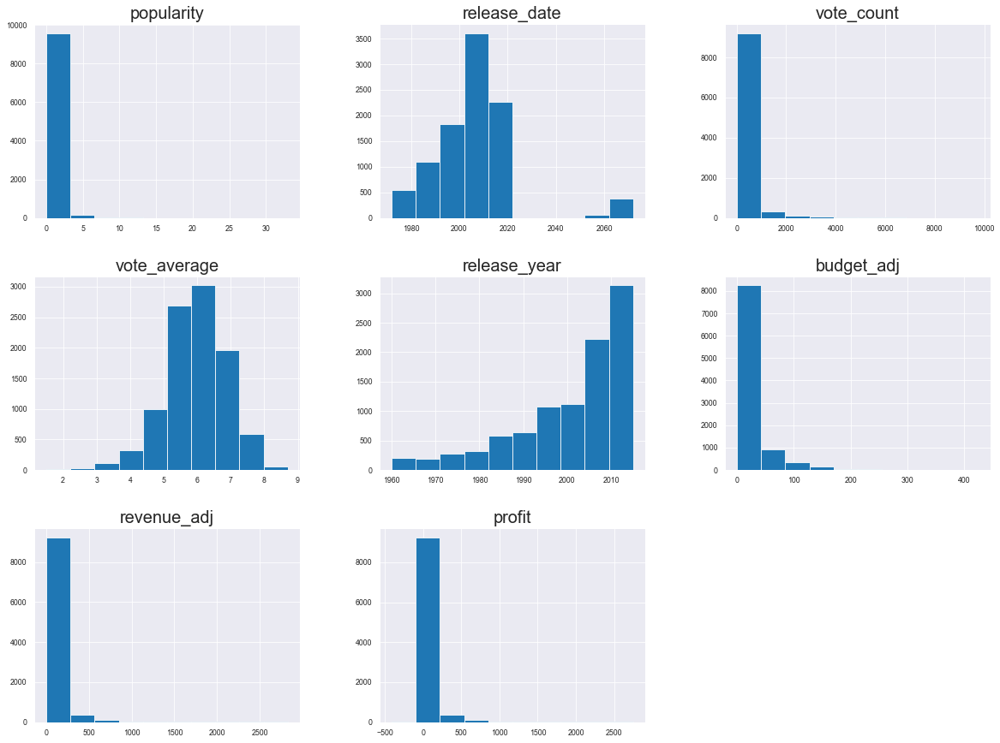

In [76]:
# Histograms of all the numeric variables
movies.hist(figsize=(20,15));

#### Firstly we see in release_year is skew left that indicate that the number of movies has increased over time, there are few movies with more than 5 of popularity, vote_average is quite normal with the mean close to 6, most movies have a budget_adj of less than 100 millions and skew right, profit and revenue_adj have the same shape

## Let's make a pairplot to try to see how the variables are releted each other.

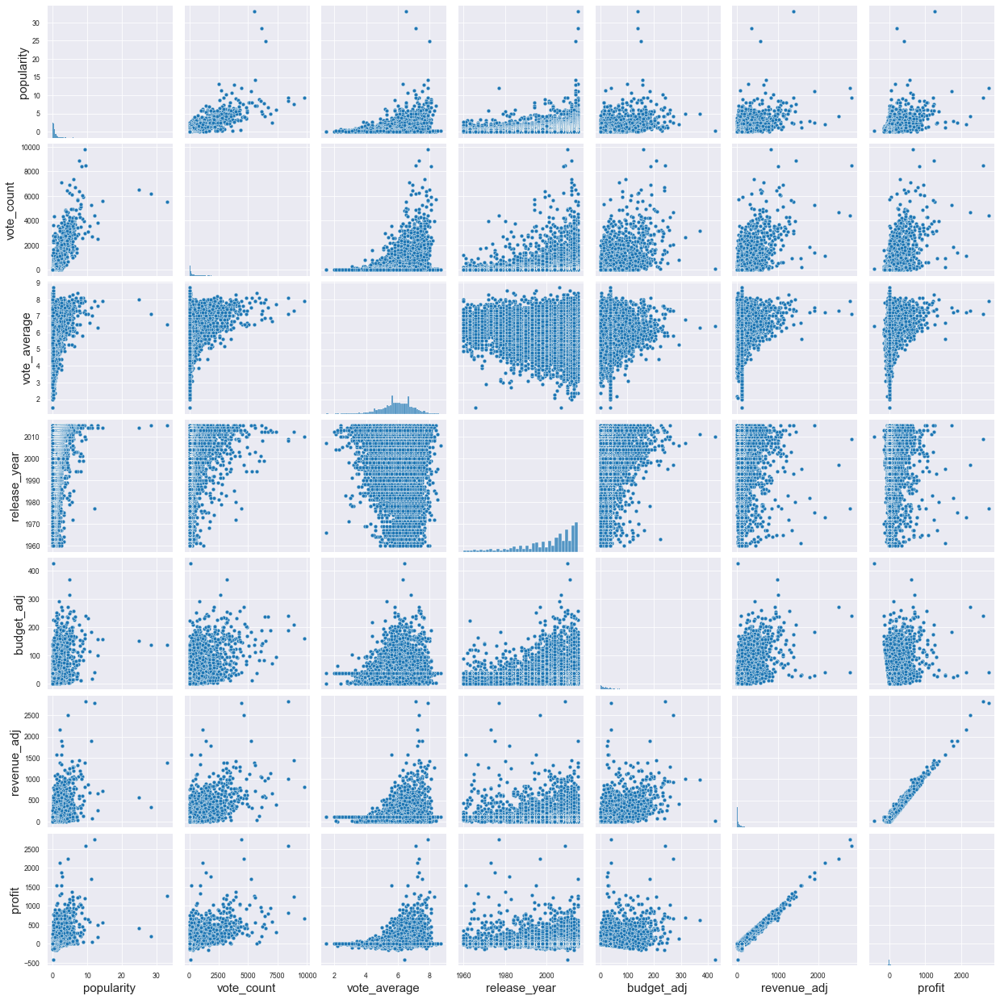

In [77]:
sns.pairplot(movies);

#### Taking a quick look we can see that there seems to be a positive relationship between vote_average is related to profit, budget_adj and revenue_adj. There is also a positive relationship between revenue_adj and profit; It also seems that there is an increase in the budget_adj with release_year

<a id='question1'></a>
### Research Question 1 (How popularity can afect adjested revenue and  profit by movie?)
> We are goin to make a plot to try to anwser this question.

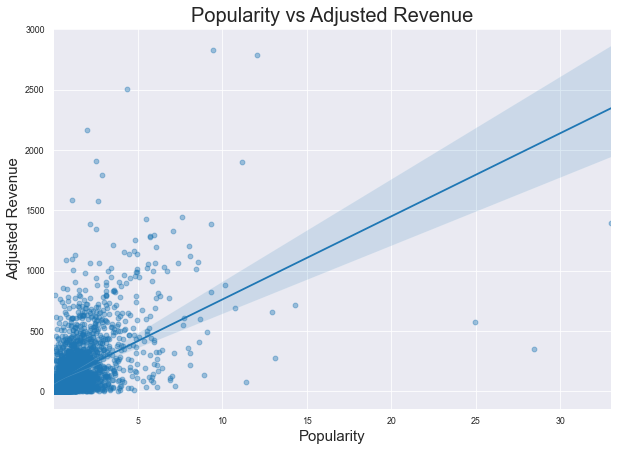

In [78]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
g = sns.regplot(x="popularity", y="revenue_adj", data= movies, scatter_kws={'alpha':0.4})
g.set_xlabel('Popularity')
g.set_ylabel('Adjusted Revenue')
g.set(title='Popularity vs Adjusted Revenue')
plt.gcf().set_size_inches(10, 7);

#### We see a strong relationship between popularity and adjusted revenue 

### Let's create a plot to see how much popularity afect profit by movie

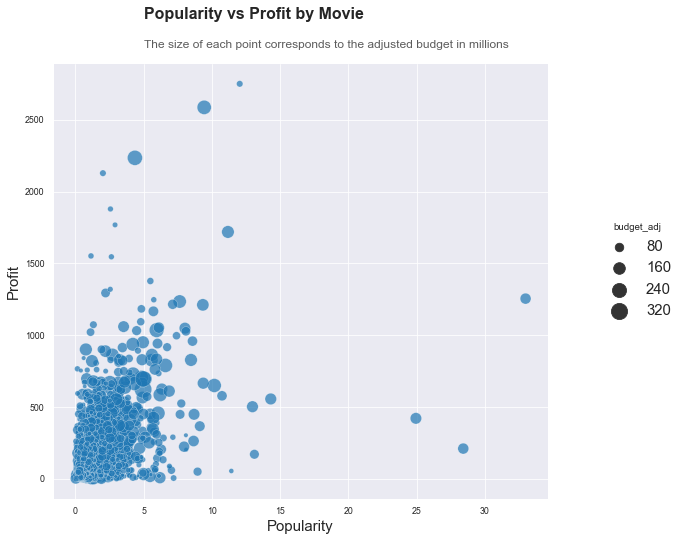

In [79]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15, 'legend.fontsize':15})
g = sns.relplot(x="popularity", y="profit", size="budget_adj", 
            sizes=(10, 300),alpha =0.7, data=movies[movies['profit'] >0])

g.set_xlabels('Popularity')
g.set_ylabels('Profit')

#g.set(title = 'Profit by Movie vs Number of Movies and represent by profit' )

plt.text(x= 5, y=3200, s='Popularity vs Profit by Movie', fontsize=16, weight='bold')
plt.text(x= 5, y=3000, s='The size of each point corresponds to the adjusted budget in millions', fontsize=12, alpha=0.75)

plt.gcf().set_size_inches(10, 7);

#### High popularity is associated with high profits and large budgets.

<a id='question2'></a>
### Research Question 2 (How high budgets can afect popularity?)
> We are goin to make a plot to try to anwser this question.
Let's explore the relation between budget_adj and popularity Making a plot to try to get it

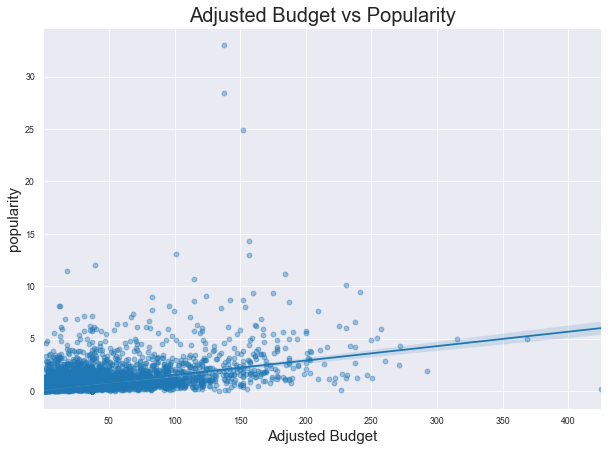

In [80]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
g = sns.regplot(x="budget_adj", y="popularity", data= movies, scatter_kws={'alpha':0.4})
g.set_xlabel('Adjusted Budget')
g.set_ylabel('popularity')
g.set(title='Adjusted Budget vs Popularity')
plt.gcf().set_size_inches(10, 7);

#### The regresion line shows a smooth positive relation among those variable, It seem that movies with hight budget have a better popularity.

<a id='question2.1'></a>
### What are the 20 movies with more vote_count?

In [81]:
movies[['original_title', 'vote_average', 'vote_count']].sort_values(by='vote_count', ascending = False).head(20) 

,original_title,vote_average,vote_count
1919,Inception,7.9,9767
4361,The Avengers,7.3,8903
1386,Avatar,7.1,8458
2875,The Dark Knight,8.1,8432
4364,Django Unchained,7.7,7375
4382,The Hunger Games,6.7,7080
5425,Iron Man 3,6.9,6882
4363,The Dark Knight Rises,7.5,6723
629,Interstellar,8.0,6498
4367,The Hobbit: An Unexpected Journey,6.9,6417


#### We see that movie with high number of vote_count have high vote_average

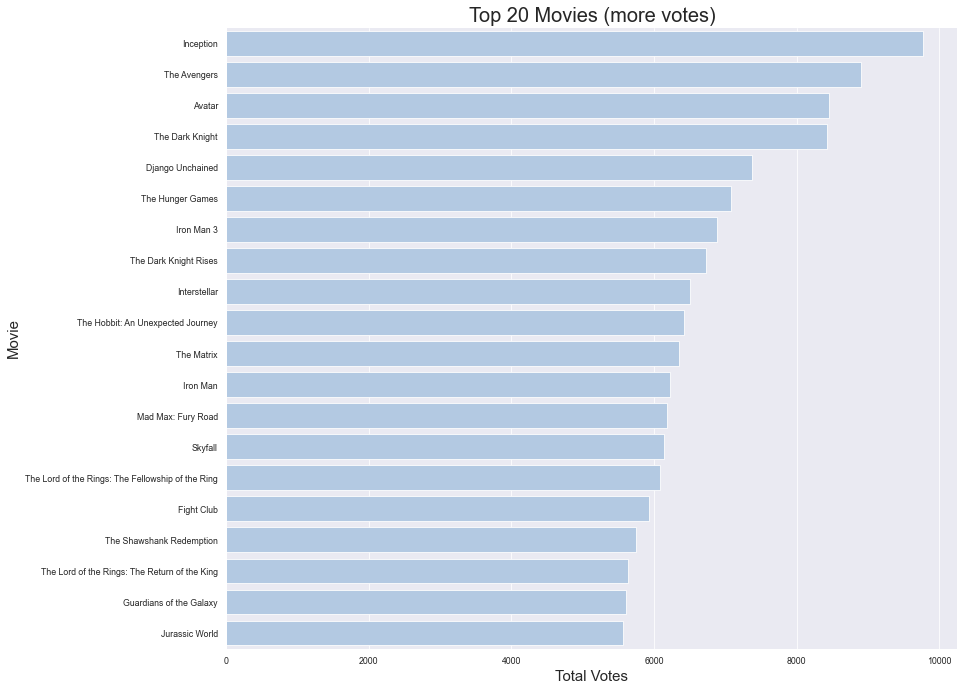

In [82]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
sns.set_style("darkgrid")
g =sns.catplot(x="vote_count", y="original_title", kind = 'bar',color= '#abc9ea',
               data=movies[['original_title', 'vote_average', 'vote_count']].sort_values(by='vote_count', ascending = False).reset_index().head(20)) 
g.set_axis_labels( 'Total Votes', 'Movie')
#g.set_xticklabels(rotation=75)
g.set(title='Top 20 Movies (more votes)')
#g.bar_label(g.containers[0])
plt.gcf().set_size_inches(30, 10)

<a id='question3'></a>
### Research Question 3 (What are the 20 most profitable movies of all time?)

In [83]:
movies[['original_title', 'profit']].sort_values(by='profit', ascending = False).head(20)

,original_title,profit
1329,Star Wars,2750.13
1386,Avatar,2586.23
5231,Titanic,2234.72
10594,The Exorcist,2128.03
9806,Jaws,1878.65
8889,E.T. the Extra-Terrestrial,1767.96
3,Star Wars: The Force Awakens,1718.72
8094,The Net,1551.57
10110,One Hundred and One Dalmatians,1545.63
7309,The Empire Strikes Back,1377.00


The most profitable movie in all time is **Star Wars**, the second place is Avatar and Titanic in third place.

<a id='question4'></a>
### Research Question 4 (Large budgets produce large revenues?)

### Let's make a plot to represent the relation between budget_adj and revenue_adj
We are going to use all the data

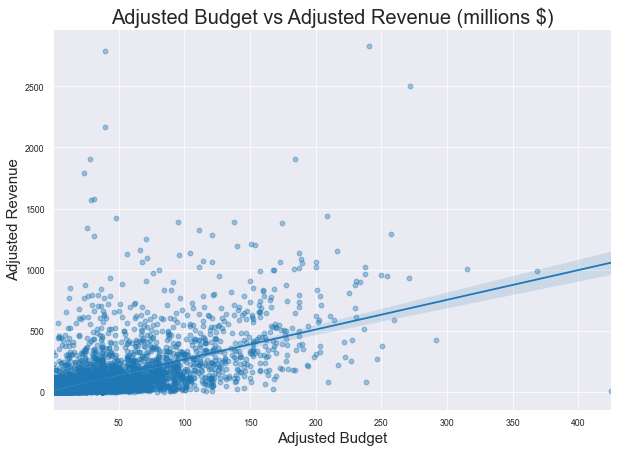

In [84]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
g = sns.regplot(x="budget_adj", y="revenue_adj", data= movies, scatter_kws={'alpha':0.4})
g.set_xlabel('Adjusted Budget')
g.set_ylabel('Adjusted Revenue')
g.set(title='Adjusted Budget vs Adjusted Revenue (millions $)')
plt.gcf().set_size_inches(10, 7);

#### It seems that a big budget has and positive impact in the increase of the revenues.

<a id='question5'></a>
### Research Question 5  (What is the total number of movies by  year?)

In [85]:
movies.groupby('release_year').agg({'original_title': 'count'}).reset_index()

,release_year,original_title
0,1960,32
1,1961,30
2,1962,30
3,1963,34
4,1964,41
5,1965,34
6,1966,44
7,1967,36
8,1968,37
9,1969,29


#### There is an increse in the number of total movies over time

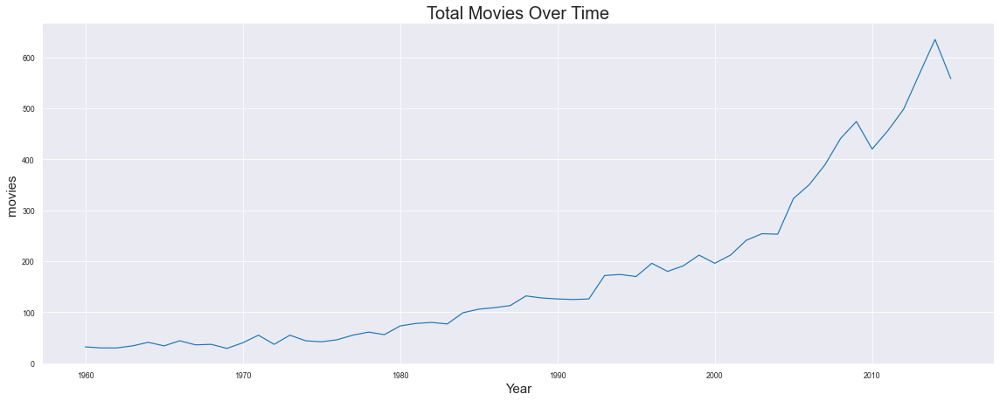

In [86]:
# Lets make a plot with all the movies by year
sns.set_context("paper", rc={"font.size":30,"axes.titlesize":20,"axes.labelsize":15})
sns.set_style("darkgrid")
g =sns.relplot(x="release_year", y="original_title", kind = 'line',
               data=movies.groupby('release_year').agg({'original_title': 'count'}).reset_index())
g.set_axis_labels("Year", "movies")
g.set(title='Total Movies Over Time')
plt.gcf().set_size_inches(20, 7)

#### In general, there was a constant increase in the number of movies along the way, in 2010 and 2015 there were  a drop in the number of movies.

<a id='question6'></a>
### Research Question 6   (Who are the top 20 directors by profit?) 

In [87]:
## Top 20 Director by total profits
movies.groupby('director').agg({'vote_count': 'sum', 'vote_average': 'mean', 
                                'profit': 'sum', 'popularity': 'mean'}).sort_values(by = 'profit', ascending=False).head(20)

,vote_count,vote_average,profit,popularity
director,,,,
Steven Spielberg,36735,6.824138,13050.64,1.875138
James Cameron,21770,6.844444,6296.23,3.202686
George Lucas,12699,6.700000,5844.15,3.910306
Peter Jackson,31796,7.000000,5644.11,3.774454
Chris Columbus,15169,6.400000,4353.34,2.251037
Robert Zemeckis,21532,6.705882,4326.95,1.977627
Michael Bay,17477,6.327273,3958.66,2.023170
David Yates,13819,7.400000,3394.44,5.126634
Tim Burton,17309,6.661111,3200.47,1.923092


 **Steven Spielberg** is the most profitable director over time

### Let's plot the top 20 directors by profit

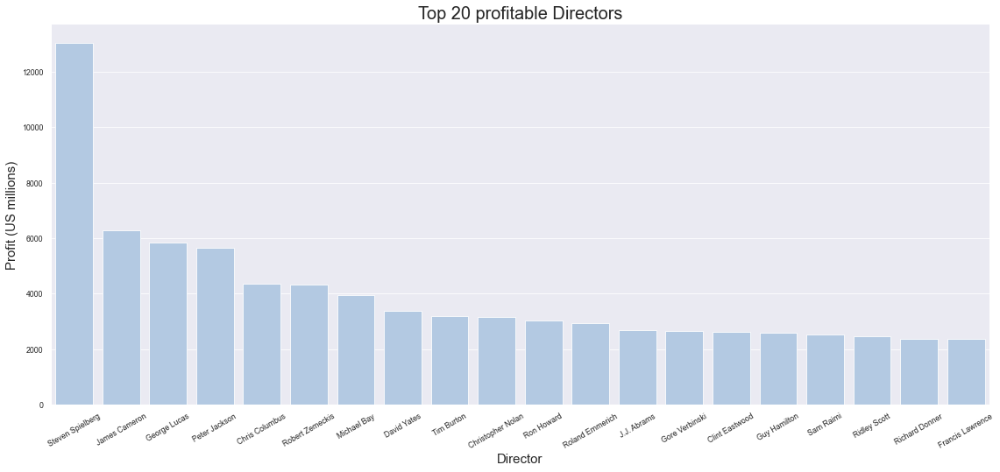

In [88]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
sns.set_style("darkgrid")
g =sns.catplot(x="director", y="profit",  kind="bar", color= '#abc9ea',
               data=movies.groupby('director').agg({'vote_count': 'sum', 'vote_average': 'mean', 
                                'profit': 'sum', 'popularity': 'mean'}).sort_values(by = 'profit', 
                                                                                    ascending=False).reset_index().head(20))
g.set_axis_labels('Director', "Profit (US millions)")
g.set_xticklabels(rotation=30)
g.set(title='Top 20 profitable Directors')
plt.gcf().set_size_inches(20, 7)

<a id='question7'></a>
### Research Question 7  (Who are the top 10 directors by popularity?) 

In [89]:
# To anwser that question we are going to consider directors with more than ten movies. We do that
# trying to be consisten with the data, because there are some director with few movies and the mean 
# can be affected for that.

direct_popularity =movies.groupby('director').agg({ 'original_title': 'count',
                                'popularity': 'mean'}).sort_values(by = 'popularity', 
                                                                   ascending=False).reset_index()
direct_popularity =direct_popularity[direct_popularity['original_title'] >=10].sort_values(by = 'popularity', 
                                                                   ascending=False).reset_index(drop=True)
direct_popularity.head(10)

,director,original_title,popularity
0,Quentin Tarantino,10,4.599180
1,Peter Jackson,13,3.774454
2,David Fincher,10,3.447978
3,Chris Columbus,14,2.251037
4,Michael Bay,11,2.023170
5,Ridley Scott,23,2.009294
6,Robert Zemeckis,17,1.977627
7,Tim Burton,18,1.923092
8,Antoine Fuqua,10,1.882736
9,Steven Spielberg,29,1.875138


### Quentin Tarantino is the the most popular director with at least 10 movies

### Get the plot the top 10 Director by popularity)

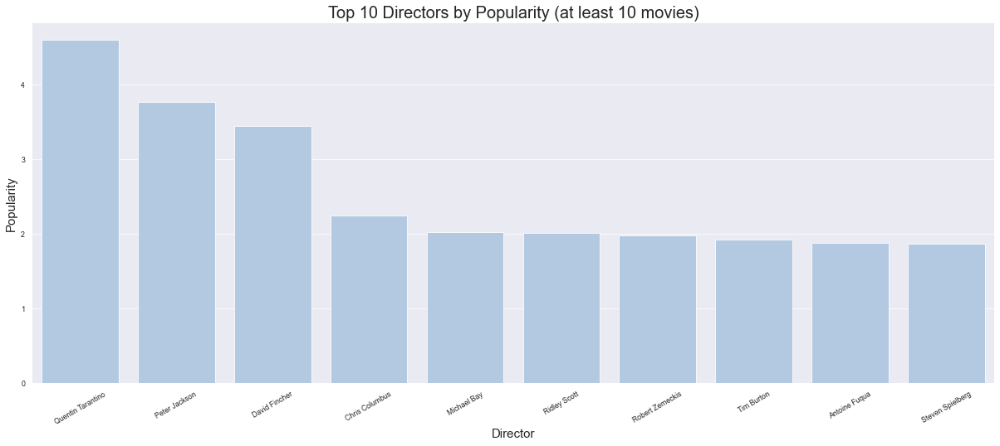

In [90]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
sns.set_style("darkgrid")
g =sns.catplot(x="director", y="popularity", kind="bar", color= '#abc9ea',
               data=direct_popularity.sort_values(by = 'popularity', ascending=False).reset_index().head(10))
g.set_axis_labels('Director', 'Popularity')
g.set_xticklabels(rotation=30)
g.set(title='Top 10 Directors by Popularity (at least 10 movies)')
plt.gcf().set_size_inches(20, 7)

## The top 10 directors with more movies

In [91]:
movies.groupby('director').agg({'original_title': 'count'}).sort_values(by = 'original_title', 
                                                                   ascending=False).reset_index().head(10)

,director,original_title
0,Woody Allen,42
1,Clint Eastwood,34
2,Steven Spielberg,29
3,Martin Scorsese,26
4,Ridley Scott,23
5,Ron Howard,22
6,Steven Soderbergh,22
7,Joel Schumacher,21
8,Brian De Palma,20
9,Wes Craven,19


#### Woody Allen is the most prolific director with 42 movies

### Let's create a function to split the string values in a column in multiple rows : cast, genres and production_companies and create new colums as we need them.¶


In [92]:
def split_list(data, col):
    
    # split the string data in each cel of the col into a list
    # and replace the column values with the list
    data[col]=data[col].apply(lambda x: x.split('|'))
    # We used Pandas explode() to separate list elements into separate rows() 
    data_split = data.explode(col)
    return data_split
   

### We are going to create 3  dataframes where we split the data by cast, genres and  production_companies from movies and after that, make some analysis and plots.

In [93]:
df_actor = split_list(movies, 'cast')    

In [94]:
df_genre = split_list(movies, 'genres') 

In [95]:
df_company = split_list(movies, 'production_companies') 

In [96]:
print(df_company.shape)
print(df_genre.shape)
print(df_actor.shape)

(23143, 13)
(24650, 13)
(48020, 13)


We have created 3 new data frame with more row tahn movies data and with the same number of columns.

In [97]:
df_company.head(3)

,popularity,original_title,cast,director,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj,profit
0,32.985763,Jurassic World,"[Chris Pratt, Bryce Dallas Howard, Irrfan Khan...",Colin Trevorrow,"[Action, Adventure, Science Fiction, Thriller]",Universal Studios,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45
0,32.985763,Jurassic World,"[Chris Pratt, Bryce Dallas Howard, Irrfan Khan...",Colin Trevorrow,"[Action, Adventure, Science Fiction, Thriller]",Amblin Entertainment,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45
0,32.985763,Jurassic World,"[Chris Pratt, Bryce Dallas Howard, Irrfan Khan...",Colin Trevorrow,"[Action, Adventure, Science Fiction, Thriller]",Legendary Pictures,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45


In [98]:
df_actor.head(3)

,popularity,original_title,cast,director,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj,profit
0,32.985763,Jurassic World,Chris Pratt,Colin Trevorrow,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45
0,32.985763,Jurassic World,Bryce Dallas Howard,Colin Trevorrow,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45
0,32.985763,Jurassic World,Irrfan Khan,Colin Trevorrow,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45


In [99]:
df_genre.head(3)

,popularity,original_title,cast,director,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj,profit
0,32.985763,Jurassic World,"[Chris Pratt, Bryce Dallas Howard, Irrfan Khan...",Colin Trevorrow,Action,Universal Studios|Amblin Entertainment|Legenda...,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45
0,32.985763,Jurassic World,"[Chris Pratt, Bryce Dallas Howard, Irrfan Khan...",Colin Trevorrow,Adventure,Universal Studios|Amblin Entertainment|Legenda...,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45
0,32.985763,Jurassic World,"[Chris Pratt, Bryce Dallas Howard, Irrfan Khan...",Colin Trevorrow,Science Fiction,Universal Studios|Amblin Entertainment|Legenda...,2015-06-09,5562,6.5,2015,138.0,1392.45,1254.45


### We must take into account that our analysis is partial, since a film can have several genres; for example, 'Jurassic World' has four genres. 'Action', 'Adventure', 'Science Fiction', 'Thriller'. What percentage of each is involved in the film? we really don't know. So for example, when we calculate the number of movies that have a given genre, all the genres involved in that movie will count as one movie made.

<a id='question13'></a>
### Research Question 8 (Which genres are most popular over time?)
>We must take into account that our analysis is partial, since a film can have several genres; for example, 'Jurassic World' has four genres. 'Action', 'Adventure', 'Science Fiction', 'Thriller'. What percentage of each is involved in the film? we really don't know. So when we calculate the number of movies that have a given genre, all the genres involved in that movie will count as one movie made. It also happens when we take the average popularity since all the genres of a specific movie are going to have the same popularity. So this is a limitation of this work.

In [100]:
# We are going to take the mean of the popularity, grouping by genres and year, and order
# by year and popularity that give us the popularity of each genre by year.
genre_max =df_genre.groupby(['genres', 'release_year']).agg({'original_title':'count', 'popularity': 
                                                             'mean'}).sort_values( by = ['release_year', 'popularity'],
                                                                       ascending=False).reset_index()
genre_max.head(20)

,genres,release_year,original_title,popularity
0,Adventure,2015,66,3.417373
1,Western,2015,6,3.178796
2,Science Fiction,2015,82,2.348382
3,Action,2015,103,2.332647
4,Crime,2015,47,1.845816
5,Fantasy,2015,32,1.790357
6,Thriller,2015,160,1.486609
7,Family,2015,41,1.447722
8,War,2015,8,1.438548
9,Mystery,2015,39,1.294805


In [101]:
genre_max.tail(20)

,genres,release_year,original_title,popularity
1022,Horror,1961,3,0.254578
1023,Western,1961,3,0.210021
1024,Fantasy,1961,1,0.113651
1025,Foreign,1961,1,0.113651
1026,Thriller,1960,6,0.811910
1027,Adventure,1960,5,0.700981
1028,Horror,1960,7,0.591450
1029,Action,1960,8,0.590724
1030,Western,1960,6,0.567759
1031,Drama,1960,13,0.566305


#### We see that in 2015 aventure genre had the highest mean popularity, in 2014 was Science Fiction.

### Let's get a table with the most popular genre by year

In [102]:
# Now We get the index of the genre by year with the maximun value
id_genres = genre_max.groupby(['release_year'])['popularity'].transform(max) == genre_max['popularity']

# We select the row by the index a order by year
popular_gender_year = genre_max[id_genres].sort_values(by = 'release_year', ascending = True)
popular_gender_year

,genres,release_year,original_title,popularity
1026,Thriller,1960,6,0.811910
1009,Animation,1961,1,2.631987
992,Adventure,1962,7,0.942513
975,Animation,1963,1,2.180410
957,War,1964,3,0.930959
940,Music,1965,2,0.968850
922,Animation,1966,2,0.751857
905,Animation,1967,1,2.550704
888,Mystery,1968,4,1.519456
870,Crime,1969,3,0.948020


## How many times the genre appears first over time?

In [103]:
popular_gender_year.groupby('genres')['release_year'].count().sort_values(ascending =False)

genres
Animation          13
Adventure          11
Fantasy             9
Crime               5
Science Fiction     4
War                 4
Family              3
Music               2
Mystery             2
Action              1
History             1
Thriller            1
Western             1
Name: release_year, dtype: int64

#### We see Animation appears 13 time in firts place, Adventure 11 times in the first place and Fantasy 9

### Now we are going to get the top ten genres by year over time

In [104]:
genre10 = genre_max.groupby('release_year').popularity.nlargest(10).reset_index(0)
genre10 = genre_max.loc[genre10.index.values]
genre10.head(20)

,genres,release_year,original_title,popularity
1026,Thriller,1960,6,0.811910
1027,Adventure,1960,5,0.700981
1028,Horror,1960,7,0.591450
1029,Action,1960,8,0.590724
1030,Western,1960,6,0.567759
1031,Drama,1960,13,0.566305
1032,Romance,1960,6,0.541227
1033,Fantasy,1960,2,0.428247
1034,Music,1960,1,0.423531
1035,History,1960,5,0.412364


## Let's make a plot where we can see the evolution over time of the 10 most common genres.

In [105]:
rows, cols = 18, 3
fig, ax = plt.subplots(rows, cols, figsize=(120, 900))
                    
year = 1959
for row in range(rows):
    for col in range(cols):
        ax[row, col].bar(x ='genres', height = 'popularity',  
                data= genre10[genre10['release_year'] == year +1])
        ax[row, col].tick_params(axis='both', which='major', labelsize=60)
        
        ax[row, col].set_ylabel( 'Popularity mean',fontsize = 65)
        
        ax[row, col].set_title( 'Genres by popularity ' + '(' + str(year + 1) +')', fontsize = 70)
        ax[row, col].tick_params(axis='x', labelrotation=30, size=100)
        
        year += 1
        
plt.show()

#### The graph shown above answers the question: Which genres are most popular from year to year? base on mean popularity

<a id='question8'></a>
### Research Question 9 (What are the most common genres with the greatest number of films over time?)

In [106]:
df_genre.groupby('genres').agg({'original_title':'count'}).sort_values( by = 'original_title', 
                                                                       ascending=False).reset_index()

,genres,original_title
0,Drama,4364
1,Comedy,3433
2,Thriller,2746
3,Action,2235
4,Romance,1570
5,Horror,1526
6,Adventure,1384
7,Crime,1299
8,Science Fiction,1136
9,Family,1095


#### We see the Drame follow by Comedy, Thriller, Action are the genres with more movies in total in the whole data.

###  Let's make a plot to capture the total movies by genre over time.

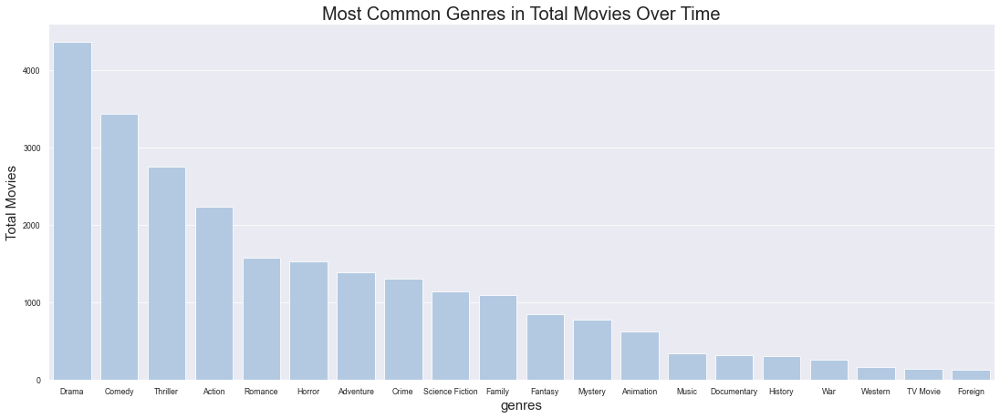

In [107]:
# Lets make a plot with all the genres with the number of movies that each one has
sns.set_context("paper", rc={"font.size":30,"axes.titlesize":20,"axes.labelsize":15})

g =sns.catplot(x="genres", y="original_title",  kind="bar", color= '#abc9ea',
               data=df_genre.groupby('genres').agg({'original_title':'count'}).sort_values( by = 'original_title', 
                                                                       ascending=False).reset_index())
g.set_axis_labels("genres", "Total Movies")
g.set(title='Most Common Genres in Total Movies Over Time')
plt.gcf().set_size_inches(20, 7)

#### Drama is by far the genre with more movies follow by Comedy, Thriller and so on.

### We'll make a line plot with the evolución over time of the number of movies by genres.
We have to be aware here that the same movie can be  categorized with more the one genre, so we are going to get a plot when the sum of all number of movie of each genre is goin to be greather than the toyal number of movie that year.

In [108]:
#Firts we are going to check how many movies there are by genre and year
genres_by_year = df_genre.groupby(['genres', 'release_year']).agg({'original_title':'count', 'profit': 'sum'}).sort_values( by = 'release_year',
                                                                              ascending=False).reset_index()
genres_by_year.head(10)

,genres,release_year,original_title,profit
0,Western,2015,6,402.16
1,Crime,2015,47,2875.57
2,Animation,2015,37,3002.85
3,Mystery,2015,39,388.86
4,Music,2015,31,517.49
5,Action,2015,103,8898.88
6,Science Fiction,2015,82,6592.38
7,Documentary,2015,38,25.70
8,Comedy,2015,143,5025.56
9,Horror,2015,115,622.21


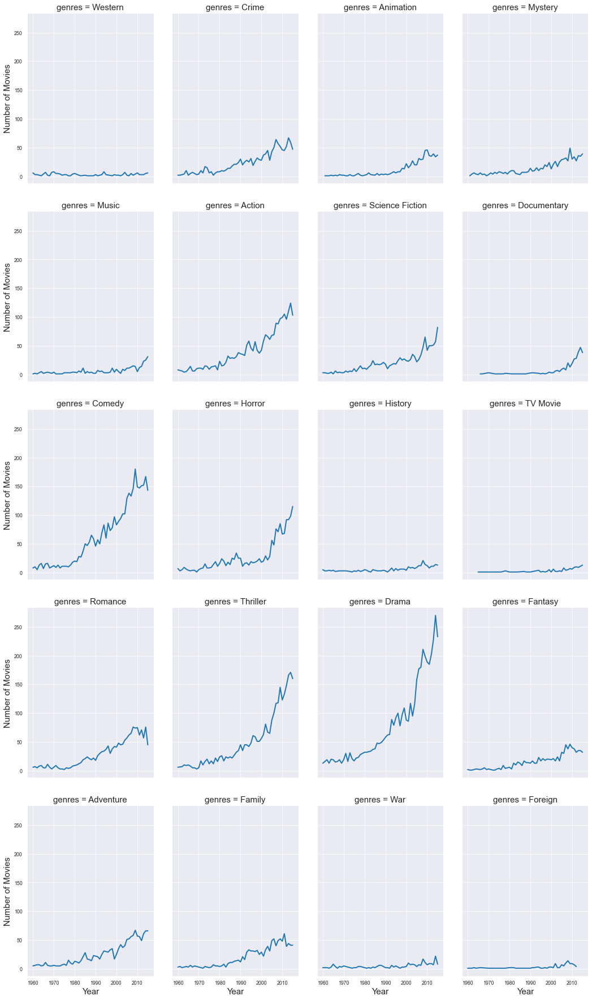

In [109]:
# This plot shows the evolution over time of the amout of movies release in each genres
sns.set_style("darkgrid")
g =sns.relplot(x="release_year", y="original_title", 
            col="genres", col_wrap=4,
            height=5, aspect=.75, linewidth=2,
            kind="line", data=(genres_by_year))
g.set_axis_labels("Year", "Number of Movies");

#### Drama is the genre with the the largest and has the fastest growing number of movies, follow by comedy, thriller and action. Almost all genres had an increase in the number of movies over time except Western, History, War and Foreign. We'll do the same analisys but using this time porcentage of each genres over the total by year.

### Let's get the porcentage of each genre

In [110]:
genres_period =genres_by_year.set_index(['genres', 'release_year'])[['original_title']]
genres_period

,,original_title
genres,release_year,
Western,2015,6
Crime,2015,47
Animation,2015,37
Mystery,2015,39
Music,2015,31
...,...,...
Romance,1960,6
Science Fiction,1960,3
Thriller,1960,6


In [111]:
## Porcentage of each genre by year
genres_porcentage_by_year = genres_period.groupby(level=1).apply(lambda x:
                                                 100 * x / float(x.sum()))

genres_porcentage_by_year = genres_porcentage_by_year.sort_values(by = 'release_year', 
                                                                  ascending = True).reset_index()
genres_porcentage_by_year

<ipython-input-111-a4c6ea7bc19e>:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  genres_porcentage_by_year = genres_period.groupby(level=1).apply(lambda x:


,genres,release_year,original_title
0,Action,1960,10.256410
1,Adventure,1960,6.410256
2,Western,1960,7.692308
3,Comedy,1960,10.256410
4,Crime,1960,2.564103
...,...,...,...
1037,Adventure,2015,5.271565
1038,Family,2015,3.274760
1039,War,2015,0.638978
1040,Horror,2015,9.185304


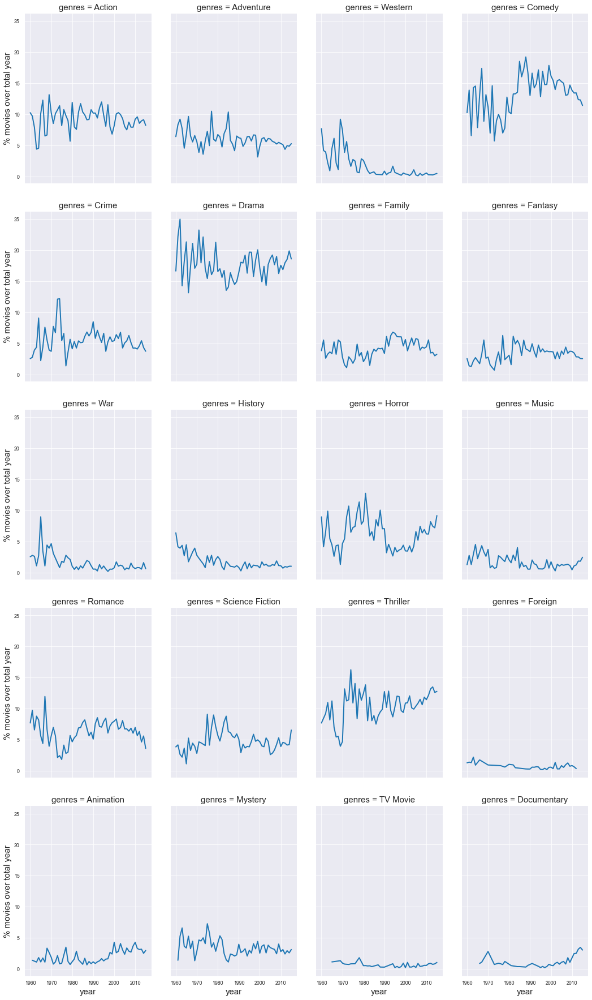

In [112]:
# This plot shows the evolution over time of the amout of movies release in each genres in porcentage
sns.set_style("darkgrid")
g =sns.relplot(x="release_year", y="original_title", 
            col="genres", col_wrap=4,
            height=5, aspect=.75, linewidth=2,
            kind="line", data=(genres_porcentage_by_year))
g.set_axis_labels("year", "% movies over total year");

#### Wester and War have a decrease in the evolution over time of the number of movies released as a percentage of the total number of movie

<a id='question9'></a>
### Research Question 10   (What are the 20 most profitable genres by movie over time?)
We are going to see which is in average the most profitable genre over time 

In [113]:
top20_genre = df_genre.groupby('genres').agg({'profit': 'mean'}).sort_values(by = 'profit',
                                                                             ascending =False).reset_index()
top20_genre

,genres,profit
0,Adventure,103.869812
1,Fantasy,80.468131
2,Family,68.355863
3,Animation,67.920470
4,Action,62.803414
5,Science Fiction,62.140070
6,War,43.315233
7,Music,40.616195
8,Thriller,36.696413
9,Crime,36.659353


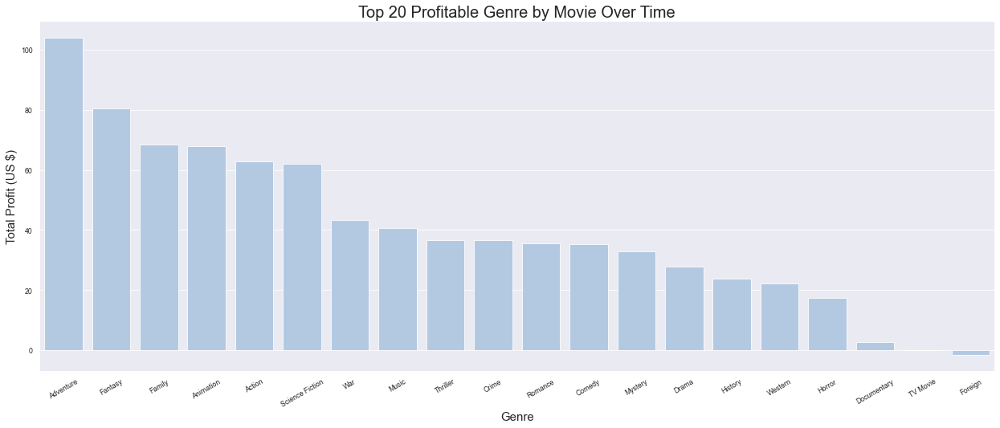

In [114]:
# Lets make a plot with all the genres with the number of movies that each one has
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
sns.set_style("darkgrid")
g =sns.catplot(x="genres", y="profit",  kind="bar", color= '#abc9ea', data=top20_genre)
g.set_axis_labels("Genre", "Total Profit (US $)")
g.set_xticklabels(rotation=30)
g.set(title='Top 20 Profitable Genre by Movie Over Time')
plt.gcf().set_size_inches(20, 7)



#### Adventure is the genre has acumulated most profits by movie over time, follow by Animation and Fantasy.

###  Let's create a data frame call companies_metric grouping by the name of the company where we agregate the most interesting variable together


In [115]:
# Let's group by name of company and calculate the sum of all profits, number of movies, sum the budget of 
# all movies, sum of all revenues, mean of vote_average and so on.
#
companies_metric = df_company.groupby('production_companies').agg({'profit':'sum', 
                                            'original_title': 'count', 'budget_adj': 'sum',
                                         'revenue_adj': 'sum','vote_average': 'mean','vote_count': 'sum',
                                         'popularity': 'mean'}).reset_index()
companies_metric.head()

,production_companies,profit,original_title,budget_adj,revenue_adj,vote_average,vote_count,popularity
0,"""DIA"" Productions GmbH & Co. KG",9.90,1,42.670000,52.570000,5.7,152,1.626534
1,# Lexyn Productions,0.00,1,37.336967,116.786792,5.6,15,0.468552
2,10 West Studios,0.00,1,37.336967,116.786792,7.4,30,0.245948
3,100 Feet Productions,-10.13,1,10.130000,116.786792,5.8,35,0.595424
4,1019 Entertainment,0.74,1,1.840000,2.580000,5.7,55,0.336107


In [116]:
companies_metric['profit/movie'] = companies_metric['profit'].div(companies_metric.original_title).round(2)

In [117]:
print(companies_metric.shape)
print(companies_metric.production_companies.nunique())
companies_metric.head()

(7842, 9)
7842


,production_companies,profit,original_title,budget_adj,revenue_adj,vote_average,vote_count,popularity,profit/movie
0,"""DIA"" Productions GmbH & Co. KG",9.90,1,42.670000,52.570000,5.7,152,1.626534,9.90
1,# Lexyn Productions,0.00,1,37.336967,116.786792,5.6,15,0.468552,0.00
2,10 West Studios,0.00,1,37.336967,116.786792,7.4,30,0.245948,0.00
3,100 Feet Productions,-10.13,1,10.130000,116.786792,5.8,35,0.595424,-10.13
4,1019 Entertainment,0.74,1,1.840000,2.580000,5.7,55,0.336107,0.74


We have the same number of rows than the number of unique companies

#### There are 7,842 different companies

<a id='question10'></a>
### Research Question 11  (What are the 20  most profitable companies over time in US dollars?)
> We can see at the same time how many movies they did to get the total profits.

In [118]:
# We are going to get a table with the 20 most profitable companies and also see how many movies they
# did to get that profit as weel the profit/movie.

top_companies =companies_metric[['production_companies','profit', 
                                 'original_title', 'profit/movie']].sort_values( by = 'profit', 
                                                                         ascending =  False).reset_index()
top_companies.head(20)

,index,production_companies,profit,original_title,profit/movie
0,7546,Warner Bros.,46767.28,509,91.88
1,7338,Universal Pictures,45271.39,522,86.73
2,5281,Paramount Pictures,40324.24,431,93.56
3,7223,Twentieth Century Fox Film Corporation,39142.90,282,138.80
4,7531,Walt Disney Pictures,25638.62,213,120.37
5,1593,Columbia Pictures,20475.57,272,75.28
6,341,Amblin Entertainment,17004.63,65,261.61
7,4892,New Line Cinema,15874.04,219,72.48
8,4539,Metro-Goldwyn-Mayer (MGM),14285.91,218,65.53
9,4170,Lucasfilm,13094.75,20,654.74


#### Warnes Bros is the company that has made more total profits over time follow by Universal Pictures and the Paramount Pictures. It is interesting to see that companies like Lucasfilm and Marvel Studios have made a lot of profits with few movies, that tell us that those companies had to do less effort to get big profits. In fact those kind of companies have a profit by movie higher than the Warner Bros.

In [119]:
# Let's get the corralation among profit, numbers o movies a profit by movie
companies_metric[['production_companies','profit', 
                  'original_title', 'profit/movie']].sort_values( by = 'profit', ascending =  False).reset_index().corr()

<ipython-input-119-a58a40208365>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  companies_metric[['production_companies','profit',


,index,profit,original_title,profit/movie
index,1.000000,0.031844,0.031531,0.001976
profit,0.031844,1.000000,0.910943,0.207911
original_title,0.031531,0.910943,1.000000,0.065098
profit/movie,0.001976,0.207911,0.065098,1.000000


#### We see that there is a big corralation between total profit (profit) and total number of movies (original_title) but is so low with profit/movie (0.030805) and that is because there are a lot of companies with few movies but with big profit by movie

### Let's make a chart showing the 20 most profitable companies over time in US dollars¶

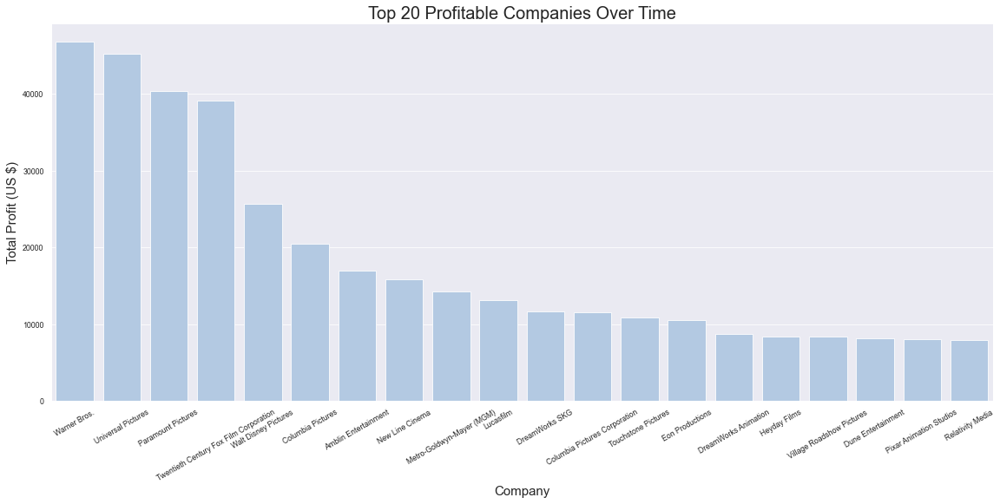

In [120]:
# Lets make a plot that shows the top 10 profitable companies over time
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
sns.set_style("darkgrid")
g =sns.catplot(x="production_companies", y="profit",  kind="bar", color= '#abc9ea', data=top_companies.head(20))
g.set_axis_labels("Company", "Total Profit (US $)")
g.set_xticklabels(rotation=30)
g.set(title='Top 20 Profitable Companies Over Time')
plt.gcf().set_size_inches(20, 7)

#### Warner Bros in the most profitable company over tiem, follow by Universal Pictures and Paramout Pictures

### let's make a graph showing the total number of movies that each company did vs total profit.
The idea is to see in a plot this relation between those variabels

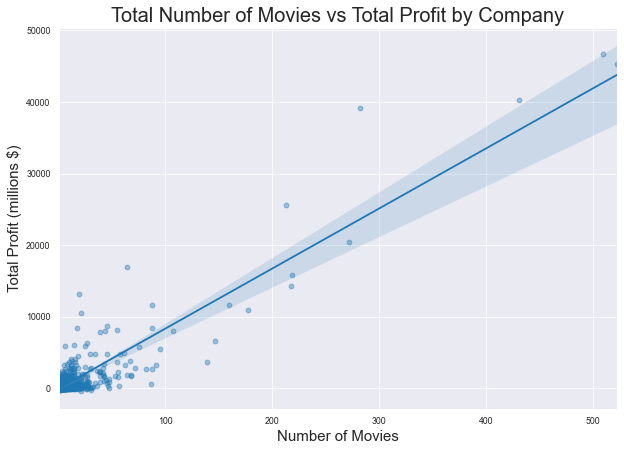

In [121]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15})
g = sns.regplot(x="original_title", y="profit", data= top_companies, scatter_kws={'alpha':0.4})
g.set_xlabel('Number of Movies')
g.set_ylabel( 'Total Profit (millions $)')
g.set(title='Total Number of Movies vs Total Profit by Company')
plt.gcf().set_size_inches(10, 7);

#### The plot shows a strong corralation that we have calculated before. Companies that have done more movies acumulated more profit over time. There are a lot of dots in the quadrant 50 movies and 5000 total profit.

<a id='question11'></a>
### Research Question 12   (What is the relationship between profit per movie and the total number of movies made?)
> we are going to choose companies with at least 5 movies to see how much return by movie those companies get.

In [122]:
profit_by_movie =companies_metric[['production_companies','original_title', 'profit', 
                                   'profit/movie', 'vote_average']].sort_values( by = 'profit/movie', ascending =False)
                                                                                
                                                                                
profit_by_movie.rename(columns={'original_title': 'number_movies'}, inplace =True)

profit_by_movie[profit_by_movie['number_movies'] >= 5].head(30)

,production_companies,number_movies,profit,profit/movie,vote_average
4053,Lightstorm Entertainment,7,5847.47,835.35,6.814286
4170,Lucasfilm,20,13094.75,654.74,6.690000
1803,Danjaq,6,3177.70,529.62,6.300000
2269,Eon Productions,22,10477.72,476.26,6.186364
3196,Heyday Films,18,8409.45,467.19,7.066667
7669,WingNut Films,15,6062.44,404.16,6.980000
6721,Syncopy,9,3441.20,382.36,7.344444
5195,Pacific Data Images (PDI),7,2635.18,376.45,6.228571
3943,Laura Ziskin Productions,5,1869.98,374.00,6.160000
7770,Zanuck/Brown Productions,6,2196.37,366.06,6.283333


#### We see that companies with few movies have gotten better return (profit by movie).

### Let's make a scatter plot to capture profit by movie vs number of movies represented by sized dots as a function of companies' total profit over time

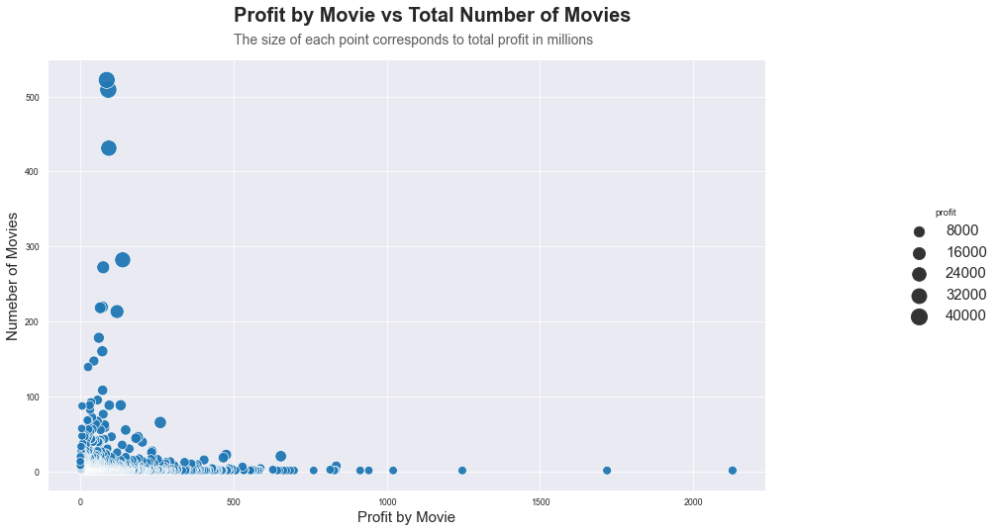

In [123]:
sns.set_context("paper", rc={"font.size":15,"axes.titlesize":20,"axes.labelsize":15, 'legend.fontsize':15})

g = sns.relplot(x="profit/movie", y="number_movies", size="profit", 
                            sizes=(70, 300),alpha =0.95, data=profit_by_movie[profit_by_movie['profit'] >5])

g.set_xlabels('Profit by Movie')
g.set_ylabels('Numeber of Movies')


plt.text(x= 500, y=600, s='Profit by Movie vs Total Number of Movies', fontsize=20, weight='bold')
plt.text(x= 500, y=570, s='The size of each point corresponds to total profit in millions', fontsize=14, alpha=0.75)

plt.gcf().set_size_inches(15, 7);

#### Most of the points are located in the quadrant formed by profit/movie (300 million per movie) and number of movies (100 movies), all of them with a low total profit over time (small points), less than 20,000 million. We see a lot of points with higher profit more than 300 millions by movie with low number of movie and there are few big dots all of them with profit by movie of less than 200 millons by movie, so the five principles companies more profitable in total over time are not the companies with more profit by movie.

<a id='question12'></a>
### Research Question 13 (The top 20  actors with the most movies)

In [124]:
# Get the firts 20 actors with more movies
df_actor.groupby('cast').agg({'original_title':'count','vote_average': 'mean',
                              'profit': 'sum'}).sort_values(by = 'original_title', ascending=False).head(20)

,original_title,vote_average,profit
cast,,,
Robert De Niro,72,6.330556,3743.08
Samuel L. Jackson,70,6.101429,5111.11
Bruce Willis,62,5.903226,4900.54
Nicolas Cage,61,5.777049,2847.80
Michael Caine,52,6.353846,3799.98
Robin Williams,51,6.043137,5430.50
Morgan Freeman,49,6.383673,3329.17
John Goodman,48,6.177083,2820.92
John Cusack,48,6.077083,1383.98


#### Robert De Niro with 72 movies is in the first place folowed by Samuel L. Jackson with 70 movies, Bruce Willis, Nicolas Cage and  Michael Caine. You can see the complete list above.

In [125]:
# Get the top 20 profitable actors
df_actor.groupby('cast').agg({'original_title':'count','vote_average': 'mean',
                              'profit': 'sum'}).sort_values(by = 'profit', ascending=False).head(20)

,original_title,vote_average,profit
cast,,,
Harrison Ford,42,6.347619,12123.16
Tom Cruise,37,6.410811,8399.51
Tom Hanks,46,6.582609,8316.47
Carrie Fisher,11,6.627273,7270.69
Emma Watson,14,6.728571,7228.30
Daniel Radcliffe,16,6.875000,7070.93
Mark Hamill,16,6.587500,7044.58
Rupert Grint,14,6.850000,6974.65
Ian McKellen,21,6.576190,6596.22


#### The first five profitable actors are Harrison Ford followed by Tom Hanks, Tom Cruise, Mark Hamill, and Carrie Fisher. we can see Leonardo DiCaprio in the 19th position.

### Let's get the top 10 vote_average actors
To be consistent with the data, we're only going to consider actors with at least 30 movies to get the rank, which gives us a sense of performance over time

In [126]:
top_vote_average =df_actor.groupby('cast').agg({'original_title': 'count','vote_average': 'mean'})
top_vote_average =top_vote_average[top_vote_average['original_title'] >=30].sort_values(by = 'vote_average', 
                                                                                  ascending = False).reset_index()
top_vote_average.head(10)

,cast,original_title,vote_average
0,Brad Pitt,38,6.736842
1,Leonardo DiCaprio,30,6.733333
2,Tom Hanks,46,6.582609
3,Christian Bale,31,6.522581
4,Scarlett Johansson,32,6.509375
5,Denzel Washington,38,6.502632
6,Woody Allen,36,6.472222
7,Johnny Depp,43,6.458140
8,Ralph Fiennes,34,6.455882
9,Cate Blanchett,31,6.454839


#### There are few differences in the vote_average among those 10 actor

<a id='question15'></a>
### Research Question 14 (What kinds of properties are associated with movies that have high revenues?)

To answer this question we have to make a summary of the analysis carried out.
- First of all, there is evidence that the most popular films have higher revenues and profits.
- On the other hand, there is a smooth correlation between movies that gain huge popularity and big budgets.
- There is evidence that big budget movies make a lot of money.
- Directors and actors also play their part, that is, there are directors and actors who are associated with high incomes like directors; Steven Spielberg, James Cameron, George Luca and Quentin Tarantino and the actors Harrison Ford, Tom Cruise, Tom Hanks.
- Genres such as Adventure, Fantasy and Family are the ones that produce the most profits per film.

<a id='conclusions'></a>
## Conclusions

- High popularity is associated with high profits and large budgets.
- There are a smooth positive corralation among budget and popularity, movies with hight budget seem to have a better popularity.
- The most profitable movie in all time is Star Wars, in the second place is Avatar and Titanic in third place.
- The evidence shows that a big budget has and positive impact in the increase of the revenues.
- There have been a constant increase in the number of movies over time, the peak was in 2014 (635 movies), in 2010 and 2015 there was a drop in the number of movies.
- Steven Spielberg is first the director by profit, follow by James Cameron and George Lucas.
- The first director by popularity is Quentin Tarantino, follow by Peter Jackson and David Fincher. We have considered only directors with more than ten (10) movies in their entire career.
- To answer the question, which genres are the most popular from year to year? We did a set of charts to look at the top ten genres for each year over time and saw that animation came in first place 13 times, adventure came in first place 11 times, and fantasy came in first place 9 times.
- Drama is the most Common Genres in the total of movies Over Time and has the fastest growing number of movies, follow by Comedy and Thriller.
- Wester and War have a decrease in the evolution over time of the number of movies released as a percentage of the total number of movies.
- Adventure is the genre that has accumulated the most benefits over time, followed by Animation and Fantasy.
- Warnes Bros is the company that has made more total profits over time follow by Universal Pictures and the Paramount Pictures. It is interesting to see that companies like Lucasfilm and Marvel Studios have made a lot of profits with few movies, that tell us that those companies had to do less effort to get big profits. In fact those kind of companies have a profit by movie higher than the Warner Bros.
- We see that there is a big corralation between total profit (profit) and total number of movies (original_title) but is so low with profit/movie (0.030805) and that is because there are a lot of companies with few movies but with big profit by movie
- Companies that have done more movies acumulated more profit over time. There are a lot of companies located  with less than 50 movies and and no more the 5000 millions total profit.
- Most of the companies are located in the quadrant formed by profit/movie (300 million per movie) and number of movies (100 movies), all of them with a low total profit over time, less than 20,000 million. We see a lot of companies with higher profit more than 300 millions by movie with low number of movie and there are few companies all of them with profit by movie of less than 200 millons by movie but with big total profit, so the five principles companies more profitable in total over time are not the companies with more profit by movie.
- Robert De Niro with 72 movies is the actor with more movies, follow by by Samuel L. Jackson with 70 movies.
- The first five profitable actors are Harrison Ford followed by Tom Hanks, Tom Cruise, Mark Hamill, and Carrie Fisher. we can see Leonardo DiCaprio in the 19th position.
- Brad Pitt is the actor with the higher average vote, follow by Leonardo DiCaprio and Tom Hank. The differences among the top ten is so low.



<a id='limitation'></a>
## Limitation in our analisys
We have had some limitations in our analysis. First, at data cleanup time, we removed 1,030 rows where production_companies appeared with na's approximately 10% of our data, perhaps it would have been more appropriate to search for that information on the internet. We also found over 5,000 rows where budget and revenue had a zero value (more than 50% of the data), so we decided to take the average of those columns and replace the zero values ​​with the mean. Being such a high percentage of rows, the most logical thing would be to try to search for that data on the internet and replace it with real values since this distorts the analysis, but for the purposes of carrying out this project we decided to implement the average.
 Second, since a movie can have several genres; for example, 'Jurassic World' has four genres. 'Action', 'Adventure', 'Science Fiction', 'Thriller'. What percentage of each is involved in the film? we really don't know. So when we calculate the number of movies that have a given genre, all the genres involved in that movie will count as one movie made, which is another limitation of our analysis. Something similar happens when we take the average popularity of the genres, since all the genres of a specific movie are going to have the same popularity, so this is another limitation of this work and the same applies to the actors or actresses, since they do not we have an order of importance of them.

<a id='references'></a>
## References
- https://stackoverflow.com/questions/45416684/python-pandas-replace-multiple-columns-zero-to-nan 

- https://seaborn.pydata.org/examples/scatter_bubbles.html

- https://matplotlib.org/stable/gallery/subplots_axes_and_figures/subplots_demo.html

- https://seaborn.pydata.org/generated/seaborn.catplot.html

- https://stackoverflow.com/questions/36987829/how-to-use-groupby-in-pandas-to-calculate-a-percentage-proportion-total-based